In [1]:
import os # for paths
import collections # for counting
import pandas as pd
import wordcloud
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.patheffects
import numpy as np
from PIL import Image
import string
import re
import nltk
from nltk.corpus import stopwords
import networkx
import itertools
import seaborn as sns
import mpl_toolkits
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import adjustText
import pathlib
import copy

# plot parameters

In [2]:
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titleweight'] = 'bold'
plt.rcParams['figure.labelweight'] = 'bold'
plt.rcParams['figure.titleweight'] = 'bold'
font_size_plot = 15
plt.rcParams['font.size'] = font_size_plot

# stop words and dataframe

In [3]:
# imported stopwords for filtering out common words
imported_stopwords = nltk.corpus.stopwords.words('english')
# add more stopwords
added_stopwords_list = ['machine learning','machine','learning','model','nan','fig','doi','al','et','org','zx','jxl','https','¼','þ','jk','ð','mt','2d','3d','two','models','based','data','study','method','wang','gw','results','sy','','material','materials','use','using','used','ml','elsevier','rights','reserved','authors','published','ev','however','article','two dimensional materials','two dimensional','deep learning','performance','two dimensional 2 d','ga']
for letter in string.ascii_letters:
    added_stopwords_list.append(letter)
imported_stopwords.extend(added_stopwords_list)

# load dataframe
dataframe = pd.read_csv('Scopus Data.csv')
dataframe = dataframe.reset_index(drop=True)
dataframe.head(3)

,Authors,Author full names,Author(s) ID,Title,Year,Source title,Volume,Issue,Art. No.,Page start,...,ISBN,CODEN,PubMed ID,Language of Original Document,Abbreviated Source Title,Document Type,Publication Stage,Open Access,Source,EID
0,Parida S.; Mishra A.; Yang Q.; Dobley A.; Cart...,"Parida, S. (57218325772); Mishra, A. (57217071...",57218325772; 57217071759; 59099395300; 6602570...,Data-driven search for promising intercalating...,2024,Journal of Materials Science,59.0,3,NaN,932,...,NaN,JMTSA,NaN,English,J Mater Sci,Article,Final,NaN,Scopus,2-s2.0-85181703606
1,Lu M.; Ji H.; Chen Y.; Gao F.; Liu B.; Long P....,"Lu, Mingying (57364774200); Ji, Haining (57193...",57364774200; 57193057085; 57963833300; 5869058...,Machine learning assisted layer-controlled syn...,2024,Journal of Materials Chemistry C,12.0,24,NaN,8893,...,NaN,JMCCC,NaN,English,J. Mater. Chem. C,Article,Final,NaN,Scopus,2-s2.0-85195407676
2,Shen Z.; Hu X.; Tang Z.; Xiao Y.; Wang S.; Che...,"Shen, Zhangming (57222333825); Hu, Xiaonan (57...",57222333825; 57563690500; 59215263100; 5908997...,Curvature programming of freestanding 3D mesos...,2024,Journal of the Mechanics and Physics of Solids,191.0,NaN,105766,NaN,...,NaN,JMPSA,NaN,English,J Mech Phys Solids,Article,Final,NaN,Scopus,2-s2.0-85198295351


In [4]:
print(dataframe.columns)

Index(['Authors', 'Author full names', 'Author(s) ID', 'Title', 'Year',
       'Source title', 'Volume', 'Issue', 'Art. No.', 'Page start', 'Page end',
       'Page count', 'Cited by', 'DOI', 'Link', 'Affiliations',
       'Authors with affiliations', 'Abstract', 'Author Keywords',
       'Index Keywords', 'Correspondence Address', 'Editors', 'Publisher',
       'ISSN', 'ISBN', 'CODEN', 'PubMed ID', 'Language of Original Document',
       'Abbreviated Source Title', 'Document Type', 'Publication Stage',
       'Open Access', 'Source', 'EID'],
      dtype='object')


get rid of copyright marker in the end of abstract

In [5]:
dataframe_modified = dataframe.copy()
modified_abstract_list = []
copyright_list = ['©','Copyright']
for abstract_index in dataframe_modified['Abstract'].index:
    if '©' in dataframe_modified['Abstract'].loc[abstract_index]:
        split_abstract = dataframe_modified['Abstract'].loc[abstract_index].split('©')[0]
        modified_abstract_list.append(split_abstract)
    elif 'Copyright' in dataframe_modified['Abstract'].loc[abstract_index]:
        split_abstract = dataframe_modified['Abstract'].loc[abstract_index].split('Copyright')[0]
        modified_abstract_list.append(split_abstract)
    else:
        modified_abstract_list.append(dataframe_modified['Abstract'].loc[abstract_index])
dataframe_modified['Abstract'] = modified_abstract_list
# print(dataframe_modified['Abstract'].to_string())
dataframe = dataframe_modified.copy()

# word cloud

separated words

In [6]:
# append into super string
super_string = ''
for row in dataframe.index:
    text_string = dataframe['Index Keywords'].loc[row]
    super_string = str(super_string) + str(text_string) + '; '

# get rid of special characters and numbers
super_string = re.sub(r'[^A-Za-z]+',' ',super_string)

# turn to lower case
super_string = super_string.lower()    

# turn to list
word_list = super_string.split(' ')

# join the words into individual words then split again to list
word_list = ' '.join(word for word in word_list).split(' ')

# get rid of unwanted words
word_list = [word for word in word_list if word not in imported_stopwords]

separated_word_final_list = word_list.copy()
separated_word_final_string = ', '.join(word for word in separated_word_final_list)

# print(separated_word_final_list)
# print(separated_word_final_string)

whole words

In [7]:
# append into super string
super_string = ''
for row in dataframe.index:
    text_string = dataframe['Index Keywords'].loc[row]
    super_string = str(super_string) + str(text_string) + '; '

# turn to lower case
super_string = super_string.lower()    

# turn to list
word_list = super_string.split('; ')

# get rid of special characters ONLY
word_list = [re.sub(r'\W+',' ',word) for word in word_list]
word_list = [word for word in word_list if word != '']
word_list = [word[:-1] if word[-1] == ' ' else word for word in word_list]

# get rid of unwanted words
word_list = [word for word in word_list if word not in imported_stopwords]

whole_word_final_list = word_list.copy()
whole_word_final_string = ', '.join(word for word in whole_word_final_list)

# print(whole_word_final_list)
# print(whole_word_final_string)

count common strings separated words

In [8]:
# counter for strings
counter_separated_word = collections.Counter(separated_word_final_list)
counter_separated_word_no_plural = counter_separated_word.copy()
print(counter_separated_word)

# get rid of plurals
for word in counter_separated_word:
    if word+'s' in counter_separated_word:
        counter_separated_word_no_plural.update({word:counter_separated_word_no_plural[word+'s']})
        del counter_separated_word_no_plural[word+'s']

# check if same amount
# print(counter_separated_word.total())
# print(counter_separated_word_no_plural.total())

# get the most common string and its count
most_common_string = counter_separated_word_no_plural.most_common(10)

Counter({'dimensional': 184, 'theory': 173, 'compounds': 169, 'electron': 163, 'functional': 151, 'density': 149, 'energy': 142, 'electronic': 124, 'neural': 123, 'properties': 116, 'analysis': 109, 'microscopy': 102, 'high': 89, 'networks': 89, 'transition': 85, 'systems': 82, 'chemical': 78, 'thermal': 78, 'structure': 78, 'scanning': 70, 'network': 67, 'conductivity': 65, 'metals': 64, 'deep': 62, 'calculations': 61, 'metal': 60, 'molecular': 58, 'transmission': 57, 'image': 55, 'semiconductors': 54, 'design': 54, 'potential': 54, 'molybdenum': 53, 'algorithms': 52, 'dynamics': 52, 'electric': 49, 'graphene': 49, 'storage': 46, 'first': 45, 'carbon': 45, 'hydrogen': 45, 'quantum': 43, 'reaction': 42, 'gap': 42, 'layered': 41, 'artificial': 41, 'catalyst': 40, 'property': 40, 'ion': 39, 'atoms': 39, 'methods': 38, 'convolutional': 38, 'regression': 37, 'transport': 37, 'human': 36, 'structural': 36, 'forecasting': 35, 'controlled': 35, 'van': 35, 'der': 35, 'drug': 34, 'prediction': 

count common strings whole words

In [9]:
# counter for strings
counter_whole_word = collections.Counter(whole_word_final_list)
counter_whole_word_no_plural = counter_whole_word.copy()
# print(counter_whole_word)

# get rid of plurals
for word in counter_whole_word:
    if word+'s' in counter_whole_word:
        counter_whole_word_no_plural.update({word:counter_whole_word_no_plural[word+'s']})
        del counter_whole_word_no_plural[word+'s']

# check if same amount
# print(counter_whole_word.total())
# print(counter_whole_word_no_plural.total())

# get the most common string and its count
most_common_string = counter_whole_word_no_plural.most_common(10)
# print(most_common_string)

In [10]:
# print(counter_whole_word_no_plural.most_common(20))

plot separated words

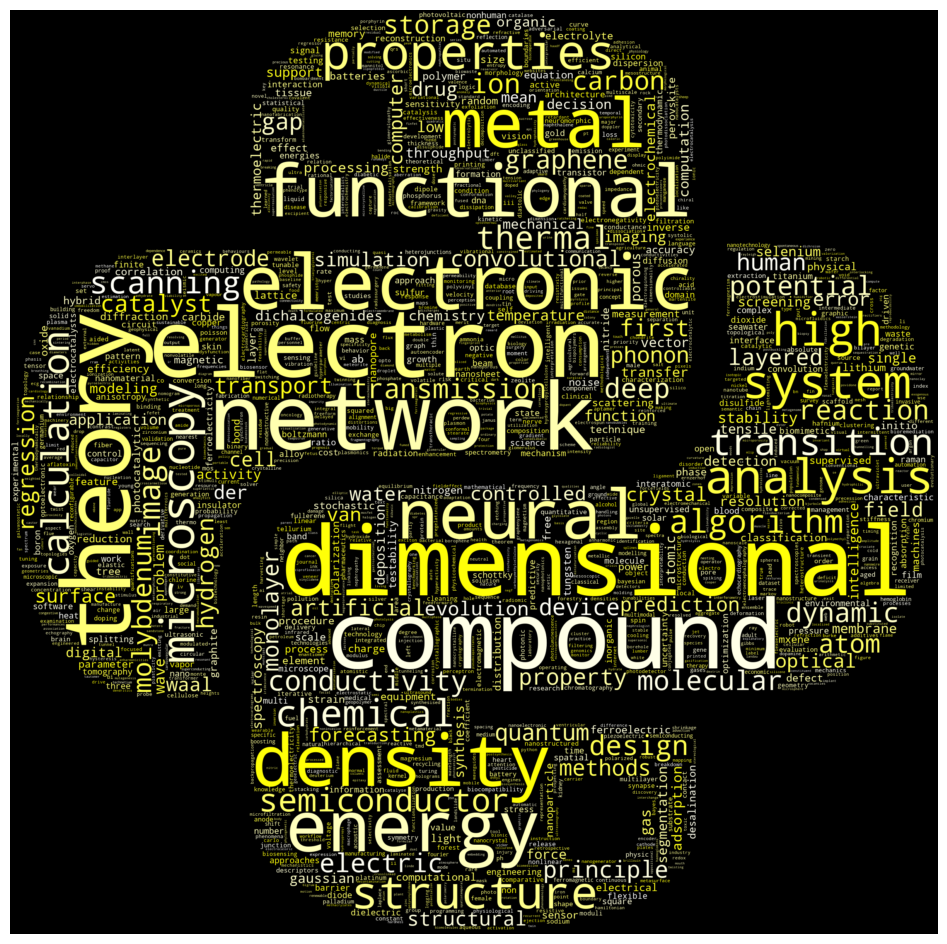

In [11]:
# mask for image
mask_coloring = np.array(Image.open('python.png'))

# generate word cloud with mask, generate from frequency uses counter
custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list('',['white','yellow'])
generated_wordcloud = wordcloud.WordCloud(width=800,height=800,background_color='black',colormap=custom_cmap,mask=mask_coloring,max_words=None,random_state=0,relative_scaling=0.25,min_font_size=8).generate_from_frequencies(counter_separated_word_no_plural)

# generate word cloud with no mask
# generated_wordcloud = wordcloud.WordCloud(width=800,height=800,background_color='white',colormap='gist_rainbow',max_words=None).generate(final_string)

# display the word cloud using matplotlib
plt.figure(figsize=(12,12))
plt.imshow(generated_wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

plot whole words

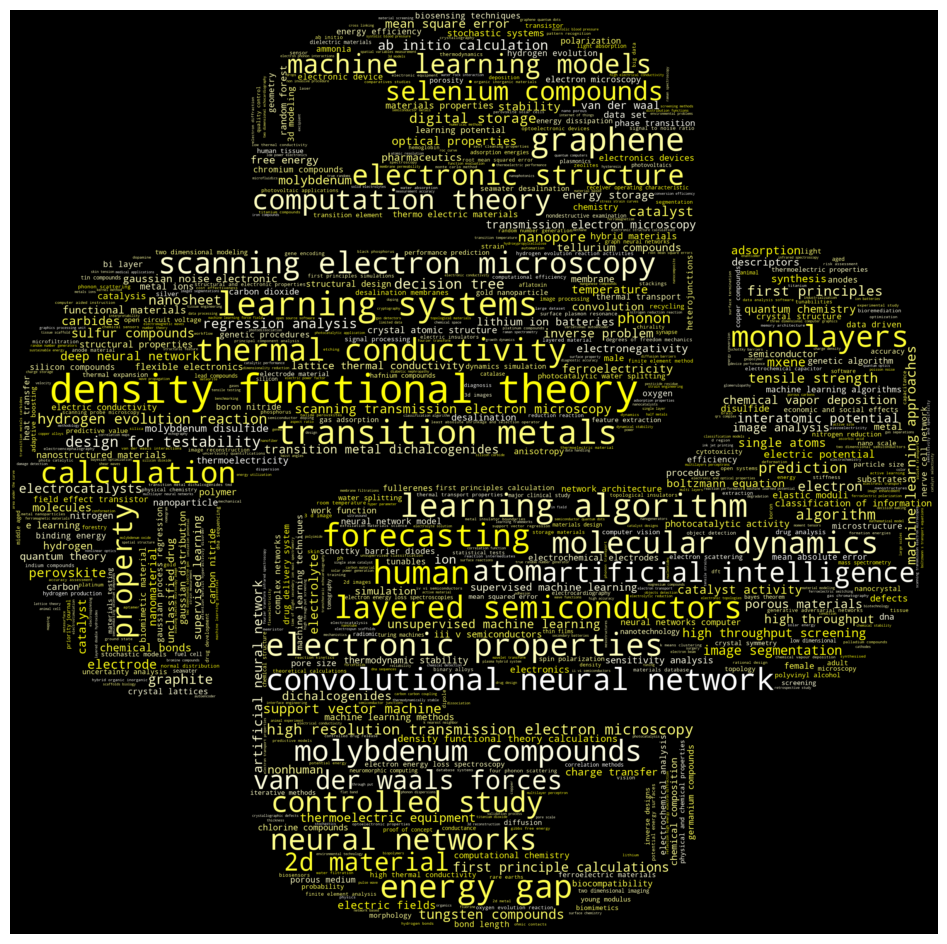

In [12]:
# mask for image
mask_coloring = np.array(Image.open('python.png'))

# generate word cloud with mask, generate from frequency uses counter
custom_cmap = matplotlib.colors.LinearSegmentedColormap.from_list('',['white','yellow'])
generated_wordcloud = wordcloud.WordCloud(width=800,height=800,background_color='black',colormap=custom_cmap,mask=mask_coloring,max_words=None,random_state=0,relative_scaling=0.25,min_font_size=8).generate_from_frequencies(counter_whole_word_no_plural)

# generate word cloud with no mask
# generated_wordcloud = wordcloud.WordCloud(width=800,height=800,background_color='white',colormap='gist_rainbow',max_words=None).generate(final_string)

# display the word cloud using matplotlib
plt.figure(figsize=(12,12))
plt.imshow(generated_wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

# co-occurence network

get pairs for graph

In [13]:
abstract_dataframe = dataframe['Abstract'].copy()
abstract_dataframe = abstract_dataframe.dropna()
abstract_dataframe = abstract_dataframe.reset_index(drop=True)

co_occurrence_pairs = []

for article_index in range(len(abstract_dataframe.index)):

    # get article abstract
    article_abstract = abstract_dataframe.loc[article_index]

    # split and lower case the words while filtering stopwords
    article_abstract = re.sub(r'[^A-Za-z]+',' ',article_abstract)
    article_abstract = article_abstract.split(' ')
    article_abstract = [word.lower() for word in article_abstract if word.lower() not in imported_stopwords]

    # get rid of plurals
    article_abstract_no_plural = article_abstract.copy()
    for unique_word in list(set(article_abstract.copy())):
        # get the index of plural words
        if unique_word+'s' in article_abstract.copy():
            word_index_list = [index for index,word in enumerate(article_abstract) if word == unique_word+'s']
        else:
            word_index_list = []
        # change value of element to non plural
        for index in word_index_list:
            article_abstract_no_plural[index] = article_abstract[index][:-1]

    # set article abstract as non plural version
    article_abstract = article_abstract_no_plural.copy()

    # create a set where the word pairs are the words that are followed by another word
    for word_position in range(len(article_abstract)):
        # if it is the last word
        if word_position == len(article_abstract)-1:
            pass
        # if not last word, append
        else:
            word_pair = (article_abstract[word_position],article_abstract[word_position+1])
        # if the word is not the same word, append
        if word_pair[0] != word_pair[1]:
            co_occurrence_pairs.append(word_pair)

# count the frequency of co occurrence pairs
co_occurrence_counts = collections.Counter(co_occurrence_pairs)
# print(co_occurrence_pairs)

# get the most common string and its count
co_occurrence_counts = {key: val for key, val in co_occurrence_counts.items() if val > 100}
# print(co_occurrence_counts)

get rid of plurals

In [14]:
abstract_dataframe = dataframe['Abstract'].copy()
abstract_dataframe = abstract_dataframe.dropna()
abstract_dataframe = abstract_dataframe.reset_index(drop=True)

co_occurrence_pairs = []
accumulated_article_text_list = []

# get the accumulated unique texts to get rid of plurals
for article_index in range(len(abstract_dataframe.index)):
    # get article abstract
    article_abstract = abstract_dataframe.loc[article_index]
    # split and lower case the words while filtering stopwords
    article_abstract = re.sub(r'[^A-Za-z]+',' ',article_abstract)
    article_abstract = article_abstract.split(' ')
    article_abstract = [word.lower() for word in article_abstract if word.lower() not in imported_stopwords]
    # accumulate the text
    accumulated_article_text_list = accumulated_article_text_list + article_abstract

# get unique words in all articles
unique_accumulated_article_text_list = list(set(accumulated_article_text_list))

# get rid of plurals and accumulate
for article_index in range(len(abstract_dataframe.index)):

    # get article abstract
    article_abstract = abstract_dataframe.loc[article_index]

    # split and lower case the words while filtering stopwords
    article_abstract = re.sub(r'[^A-Za-z]+',' ',article_abstract)
    article_abstract = article_abstract.split(' ')
    article_abstract = [word.lower() for word in article_abstract if word.lower() not in imported_stopwords]

    # get rid of plurals with words from all articles
    article_abstract_no_plural = article_abstract.copy()
    for unique_word in unique_accumulated_article_text_list:
        # get the index of plural words
        if unique_word+'s' in article_abstract:
            word_index_list = [index for index,word in enumerate(article_abstract) if word == unique_word+'s']
        else:
            word_index_list = []
        # change value of element to non plural
        for index in word_index_list:
            article_abstract_no_plural[index] = article_abstract[index][:-1]

    # set article abstract as non plural version
    article_abstract = article_abstract_no_plural.copy()

    # create a set where the word pairs are the words that are followed by another word
    for word_position in range(len(article_abstract)):
        # if it is the last word
        if word_position == len(article_abstract)-1:
            pass
        # if not last word, append
        else:
            word_pair = (article_abstract[word_position],article_abstract[word_position+1])
        # if the word is not the same word, append
        if word_pair[0] != word_pair[1]:
            co_occurrence_pairs.append(word_pair)

# count the frequency of co occurrence pairs
co_occurrence_counts = collections.Counter(co_occurrence_pairs)
# print(co_occurrence_pairs)

# get the most common string and its count
co_occurrence_counts = {key: val for key, val in co_occurrence_counts.items() if val > 8}
# print(co_occurrence_counts)

circular

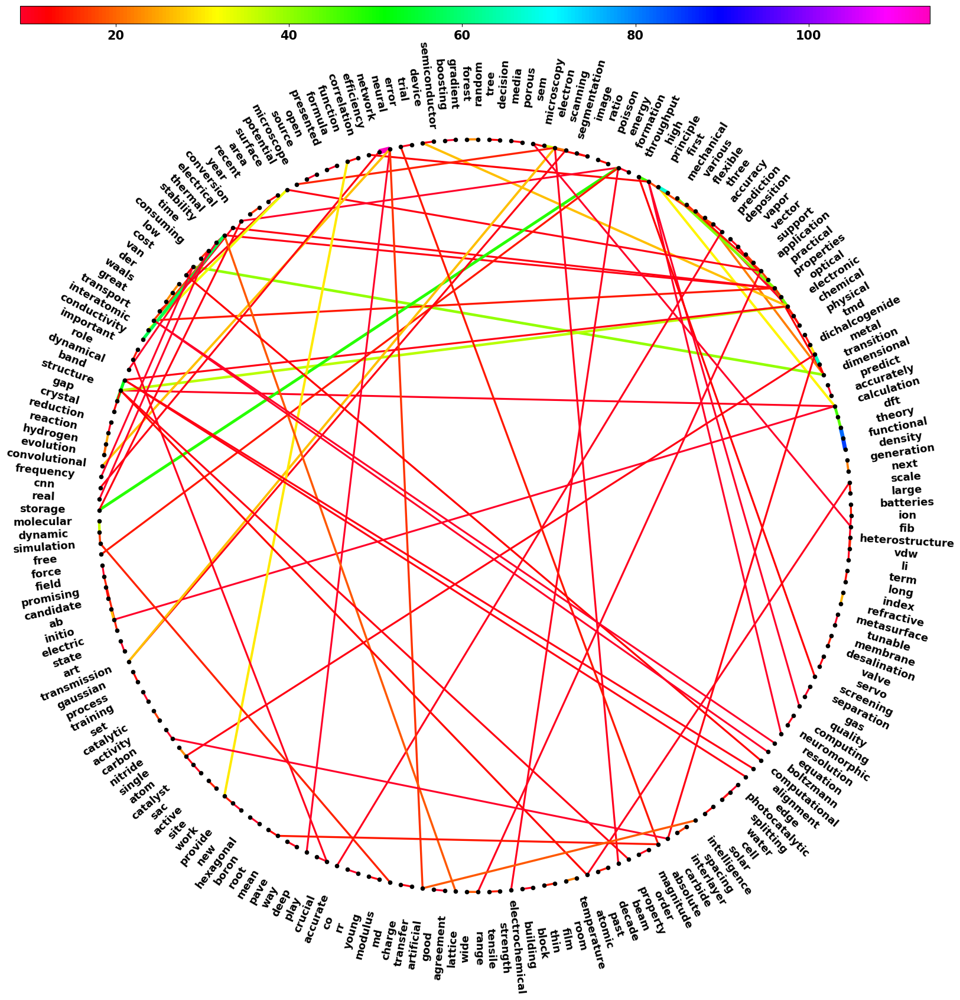

In [15]:
network_graph = networkx.Graph()

# add edges
for word_pair,frequency in co_occurrence_counts.items():
    word1,word2 = word_pair[0],word_pair[1]
    network_graph.add_edge(word1,word2,weight=frequency)

# identify number of edges and nodes
number_of_edges = network_graph.number_of_edges()
number_of_nodes = network_graph.number_of_nodes()

# print(number_of_edges)
# print(number_of_nodes)

fig = plt.figure(figsize=(20,20))
ax_circular = plt.subplot2grid((1,1),(0,0),fig=fig)

# pos = networkx.spring_layout(network_graph,k=0.5,iterations=200,seed=1)
pos = networkx.circular_layout(network_graph)
# print(pos)
adjusted_pos = {key: val*1.2 for key, val in pos.items()}
# print(adjusted_pos)

# get the edges weight for edge size and color
edge_labels = networkx.get_edge_attributes(network_graph,name='weight')
edge_labels_values_list = list(edge_labels.copy().values())
# get edge size
plot_edge_labels_values = [(((value-min(edge_labels_values_list))/(max(edge_labels_values_list)-min(edge_labels_values_list)))+1.5)**2 for value in edge_labels_values_list]
# get edge color map and color
edge_cmap = matplotlib.colormaps['gist_rainbow']
plot_edge_color_values = [edge_cmap(((value-min(edge_labels_values_list))/(max(edge_labels_values_list)-min(edge_labels_values_list)))) for value in edge_labels_values_list]

# draw network
nodes = networkx.draw_networkx_nodes(network_graph,pos,node_size=20,node_color='black',ax=ax_circular)
edges = networkx.draw_networkx_edges(network_graph,pos,edge_color=plot_edge_color_values,width=plot_edge_labels_values,alpha=1,ax=ax_circular)

# draw text
for count,word in enumerate(pos):
    if pos[word][0] > 0:
        ax_circular.text(pos[word][0]*1.15,pos[word][1]*1.15,str(word),rotation=(count/number_of_nodes)*360,fontsize=13,horizontalalignment='center',verticalalignment='center')
    else:
        ax_circular.text(pos[word][0]*1.15,pos[word][1]*1.15,str(word),rotation=((count/number_of_nodes)*360)-180,fontsize=13,horizontalalignment='center',verticalalignment='center')

# color bar
axins = inset_axes(ax_circular,width='100%',height='2%',loc='upper center',bbox_transform=ax_circular.transAxes,borderpad=0,bbox_to_anchor=(0,0.06,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(min(edge_labels_values_list),max(edge_labels_values_list))),cmap=edge_cmap),cax=axins,orientation='horizontal')
cbar.ax.tick_params(labelsize=15)

# figure parameters
ax_circular.set_aspect(1)
ax_circular.axis('off')
plt.show()

spring

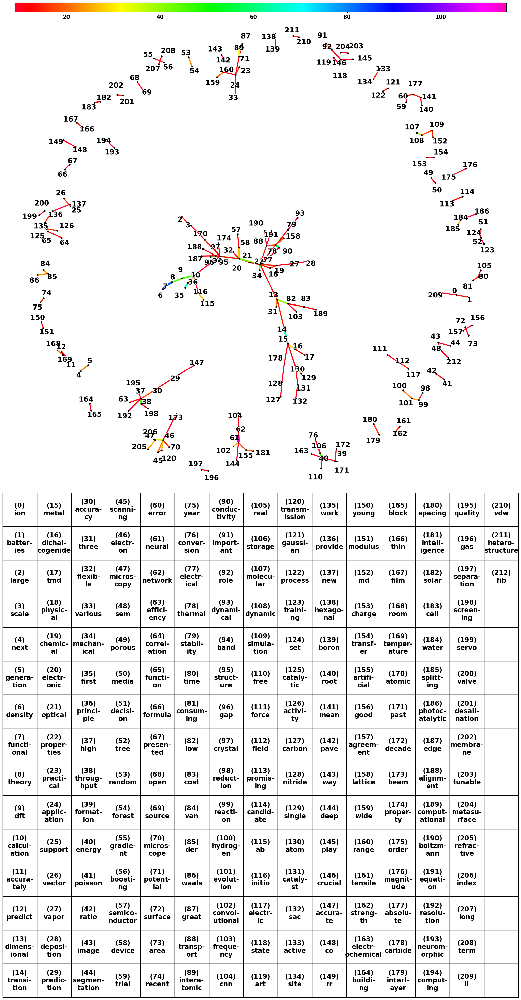

In [16]:
network_graph = networkx.Graph()

# add edges
for word_pair,frequency in co_occurrence_counts.items():
    word1,word2 = word_pair[0],word_pair[1]
    network_graph.add_edge(word1,word2,weight=frequency)

# identify number of edges and nodes
number_of_edges = network_graph.number_of_edges()
number_of_nodes = network_graph.number_of_nodes()

# print(number_of_edges)
# print(number_of_nodes)

fig_circular = plt.figure(figsize=(25,25))
ax_circular = plt.subplot2grid((1,1),(0,0),fig=fig_circular)

# graph layout
pos = networkx.spring_layout(network_graph,k=0.8,iterations=240,seed=2)
adjusted_pos = {key: val for key, val in pos.items()}

# get the edges weight for edge size and color
edge_labels = networkx.get_edge_attributes(network_graph,name='weight')
edge_labels_values_list = list(edge_labels.copy().values())
# get edge size
plot_edge_labels_values = [(((value-min(edge_labels_values_list))/(max(edge_labels_values_list)-min(edge_labels_values_list)))+1.75)**2 for value in edge_labels_values_list]
# get edge color map and color
edge_cmap = matplotlib.colormaps['gist_rainbow']
plot_edge_color_values = [edge_cmap(((value-min(edge_labels_values_list))/(max(edge_labels_values_list)-min(edge_labels_values_list)))) for value in edge_labels_values_list]

# draw network
nodes = networkx.draw_networkx_nodes(network_graph,adjusted_pos,node_size=15,node_color='black',ax=ax_circular,margins=0)
edges = networkx.draw_networkx_edges(network_graph,adjusted_pos,node_size=15,edge_color=plot_edge_color_values,width=plot_edge_labels_values,alpha=1,ax=ax_circular)

# draw text
text_list = []
for count,word in enumerate(adjusted_pos):
    plotted_text = ax_circular.text(adjusted_pos[word][0],adjusted_pos[word][1],str(count),fontsize=20,horizontalalignment='center',verticalalignment='center',color='black',path_effects=[matplotlib.patheffects.withStroke(linewidth=2,foreground='white')],alpha=1)
    text_list.append(plotted_text)

# adjust text
adjustText.adjust_text(text_list,expand=(1.5,1.5))

# color bar
axins = inset_axes(ax_circular,width='100%',height='2%',loc='upper center',bbox_transform=ax_circular.transAxes,borderpad=0,bbox_to_anchor=(0,0.02,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(min(edge_labels_values_list),max(edge_labels_values_list))),cmap=edge_cmap),cax=axins,orientation='horizontal')
cbar.ax.tick_params(labelsize=15)

# table        
table_values = list(adjusted_pos.keys())
dimensions = int(np.ceil(np.sqrt(len(table_values))))
divided_table_values = []
for split_count in range(dimensions):
    split_from = split_count*dimensions
    split_to = (split_count+1)*dimensions
    split_values = table_values[split_from:split_to]
    split_values = [f'({split_from+count})'+'\n'+word if len(word) <= 7 else f'({split_from+count})'+'\n'+word[:6]+'-'+'\n'+word[6:] for count,word in enumerate(split_values)]
    if split_values != []:
        if len(split_values) == dimensions:
            divided_table_values.append(split_values)
        else:
            for remaining_count in range(dimensions - len(split_values)):
                split_values.append('')
            divided_table_values.append(split_values)

divided_table_values = np.array(divided_table_values).transpose()

# draw table
the_table = ax_circular.table(cellText=divided_table_values,cellLoc='center')

# set table parameters
cell_dict = the_table.get_celld()
for row,col in cell_dict:
    cell_dict[(row,col)].set_height(0.07)
    cell_dict[(row,col)].set_width(0.07)
    # cell_dict[(row,col)].get_text().set_rotation(45)
the_table.auto_set_font_size(False)
the_table.set_fontsize(18.5)
# the_table.scale(1,1)

# figure parameters
ax_circular.set_aspect(1)
ax_circular.axis('off')

plt.show()

### Aesthetic

separate cluster and table

163
213


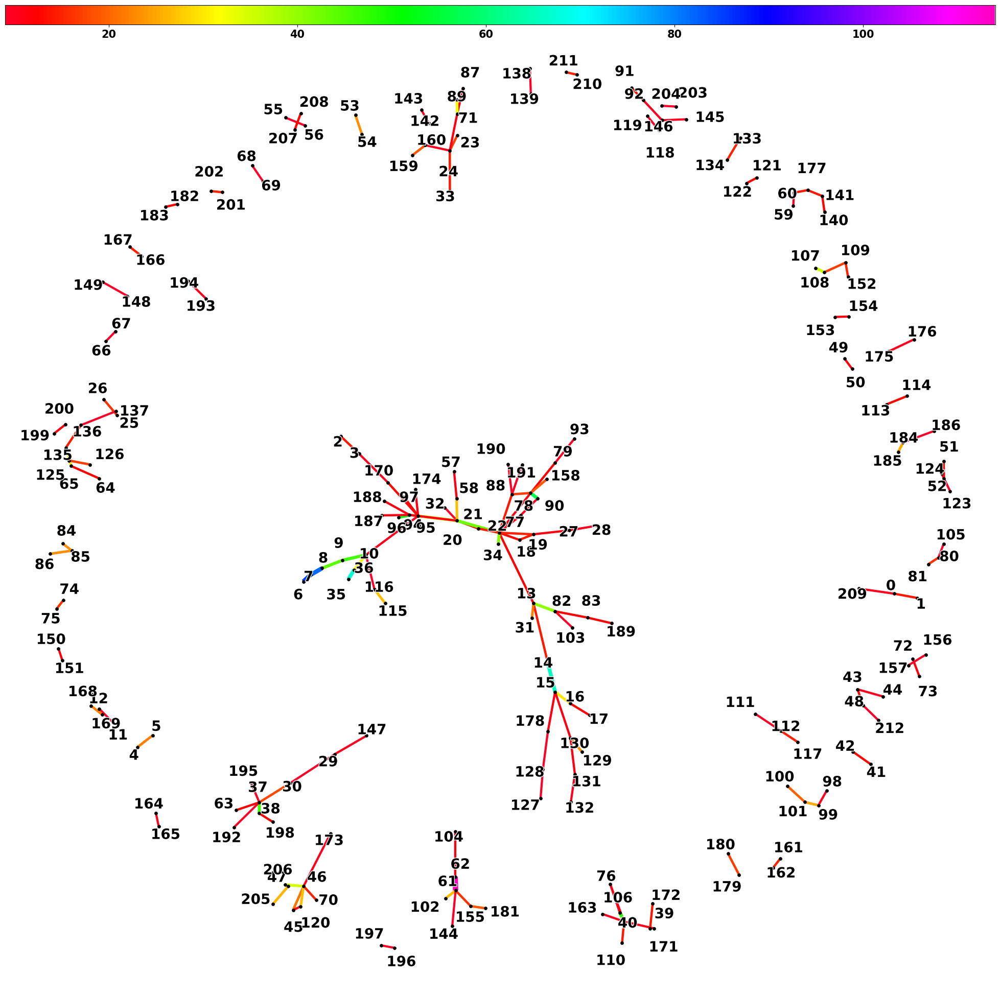

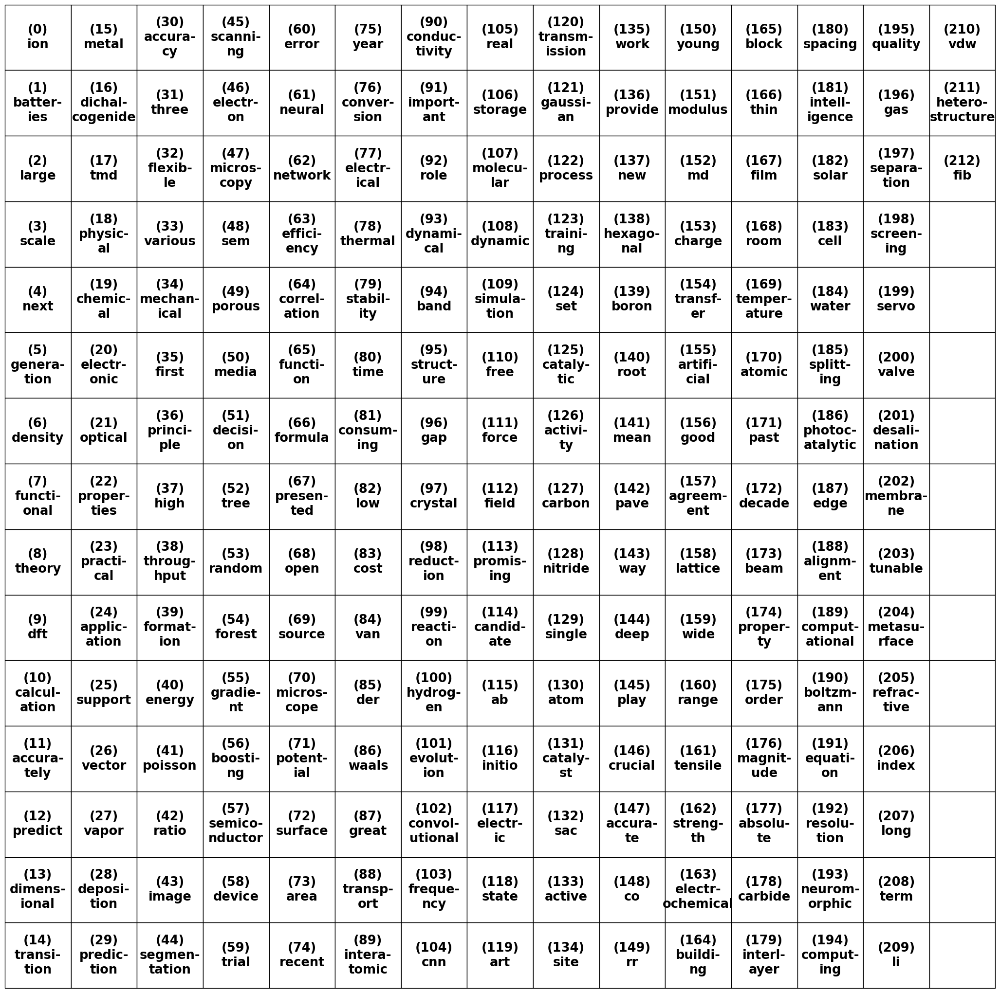

In [17]:
network_graph = networkx.Graph()

# add edges
for word_pair,frequency in co_occurrence_counts.items():
    word1,word2 = word_pair[0],word_pair[1]
    network_graph.add_edge(word1,word2,weight=frequency)

# identify number of edges and nodes
number_of_edges = network_graph.number_of_edges()
number_of_nodes = network_graph.number_of_nodes()

print(number_of_edges)
print(number_of_nodes)

fig_circular = plt.figure(figsize=(25,25))
ax_circular = plt.subplot2grid((1,1),(0,0),fig=fig_circular)
fig_table = plt.figure(figsize=(25,25))
ax_table = plt.subplot2grid((1,1),(0,0),fig=fig_table)

# graph layout
pos = networkx.spring_layout(network_graph,k=0.8,iterations=240,seed=2)
adjusted_pos = {key: val for key, val in pos.items()}

# get the edges weight for edge size and color
edge_labels = networkx.get_edge_attributes(network_graph,name='weight')
edge_labels_values_list = list(edge_labels.copy().values())
# get edge size
plot_edge_labels_values = [(((value-min(edge_labels_values_list))/(max(edge_labels_values_list)-min(edge_labels_values_list)))+1.75)**2 for value in edge_labels_values_list]
# get edge color map and color
edge_cmap = matplotlib.colormaps['gist_rainbow']
plot_edge_color_values = [edge_cmap(((value-min(edge_labels_values_list))/(max(edge_labels_values_list)-min(edge_labels_values_list)))) for value in edge_labels_values_list]

# draw network
nodes = networkx.draw_networkx_nodes(network_graph,adjusted_pos,node_size=15,node_color='black',ax=ax_circular,margins=0)
edges = networkx.draw_networkx_edges(network_graph,adjusted_pos,node_size=15,edge_color=plot_edge_color_values,width=plot_edge_labels_values,alpha=1,ax=ax_circular)

# draw text
text_list = []
for count,word in enumerate(adjusted_pos):
    plotted_text = ax_circular.text(adjusted_pos[word][0],adjusted_pos[word][1],str(count),fontsize=20,horizontalalignment='center',verticalalignment='center',color='black',path_effects=[matplotlib.patheffects.withStroke(linewidth=2,foreground='white')],alpha=1)
    text_list.append(plotted_text)

# adjust text
adjustText.adjust_text(text_list,expand=(1.5,1.5))

# color bar
axins = inset_axes(ax_circular,width='100%',height='2%',loc='upper center',bbox_transform=ax_circular.transAxes,borderpad=0,bbox_to_anchor=(0,0.02,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(min(edge_labels_values_list),max(edge_labels_values_list))),cmap=edge_cmap),cax=axins,orientation='horizontal')
cbar.ax.tick_params(labelsize=15)

# table        
table_values = list(adjusted_pos.keys())
dimensions = int(np.ceil(np.sqrt(len(table_values))))
divided_table_values = []
for split_count in range(dimensions):
    split_from = split_count*dimensions
    split_to = (split_count+1)*dimensions
    split_values = table_values[split_from:split_to]
    split_values = [f'({split_from+count})'+'\n'+word if len(word) <= 7 else f'({split_from+count})'+'\n'+word[:6]+'-'+'\n'+word[6:] for count,word in enumerate(split_values)]
    if split_values != []:
        if len(split_values) == dimensions:
            divided_table_values.append(split_values)
        else:
            for remaining_count in range(dimensions - len(split_values)):
                split_values.append('')
            divided_table_values.append(split_values)

divided_table_values = np.array(divided_table_values).transpose()

# draw table
the_table = ax_table.table(cellText=divided_table_values,cellLoc='center',loc='center') # center allows plotting in middle

# set table parameters
cell_dict = the_table.get_celld()
for row,col in cell_dict:
    cell_dict[(row,col)].set_height(0.07)
    cell_dict[(row,col)].set_width(0.07)
    # cell_dict[(row,col)].get_text().set_rotation(45)
the_table.auto_set_font_size(False)
the_table.set_fontsize(18.5)
# the_table.scale(1,1)

# figure parameters
ax_circular.set_aspect(1)
ax_circular.axis('off')
ax_table.axis('off')

plt.show()

get index of each element

In [18]:
# table values and index        
table_values = list(adjusted_pos.keys())
dimensions = int(np.ceil(np.sqrt(len(table_values))))
divided_table_values = []
for split_count in range(dimensions):
    split_from = split_count*dimensions
    split_to = (split_count+1)*dimensions
    split_values = table_values[split_from:split_to]
    split_values = [f'{split_from+count}-{word}' for count,word in enumerate(split_values)]
    if split_values != []:
        if len(split_values) == dimensions:
            divided_table_values.append(split_values)
        else:
            for remaining_count in range(dimensions - len(split_values)):
                split_values.append('')
            divided_table_values.append(split_values)

# get index from table values
divided_table_values_dict = {}
divided_table_values = np.array(divided_table_values).transpose()
divided_table_values = divided_table_values.ravel()
for pairs in divided_table_values:
    if pairs != '':
        divided_table_values_dict[pairs.split('-')[1]] = pairs.split('-')[0]
print(divided_table_values_dict)

{'ion': '0', 'metal': '15', 'accuracy': '30', 'scanning': '45', 'error': '60', 'year': '75', 'conductivity': '90', 'real': '105', 'transmission': '120', 'work': '135', 'young': '150', 'block': '165', 'spacing': '180', 'quality': '195', 'vdw': '210', 'batteries': '1', 'dichalcogenide': '16', 'three': '31', 'electron': '46', 'neural': '61', 'conversion': '76', 'important': '91', 'storage': '106', 'gaussian': '121', 'provide': '136', 'modulus': '151', 'thin': '166', 'intelligence': '181', 'gas': '196', 'heterostructure': '211', 'large': '2', 'tmd': '17', 'flexible': '32', 'microscopy': '47', 'network': '62', 'electrical': '77', 'role': '92', 'molecular': '107', 'process': '122', 'new': '137', 'md': '152', 'film': '167', 'solar': '182', 'separation': '197', 'fib': '212', 'scale': '3', 'physical': '18', 'various': '33', 'sem': '48', 'efficiency': '63', 'thermal': '78', 'dynamical': '93', 'dynamic': '108', 'training': '123', 'hexagonal': '138', 'charge': '153', 'room': '168', 'cell': '183', 

get largest node

In [19]:
total_words = []
# get all words in pairs
for word_pair in co_occurrence_counts.keys():
    total_words.append(word_pair[0])
    total_words.append(word_pair[1])
total_words = list(set(total_words))
# find the total amount of pairs with the word in it
total_node_dict = {}
for word in total_words:
    node_list = []
    for word_pair in co_occurrence_counts.keys():
        if word in word_pair:
            node_list.append(word_pair)
    total_node_dict[word] = node_list
# get the max
max_node = None
max_node_pairs = None
max_node_frequency = 0
for total_node_key in total_node_dict.keys():
    if len(total_node_dict[total_node_key]) > max_node_frequency:
        max_node = total_node_key
        max_node_pairs = total_node_dict[total_node_key]
        max_node_frequency = len(total_node_dict[total_node_key])
print(max_node)
print(max_node_pairs)
print(max_node_frequency)
# create a string
total_words = []
for word_pair in max_node_pairs:
    total_words.append(word_pair[0])
    total_words.append(word_pair[1])
largest_cluster_total_words = list(set(total_words))
print(largest_cluster_total_words)
largest_cluster_total_words_with_index_list = [f'{word} ({divided_table_values_dict[word]}) - ' for word in largest_cluster_total_words]
largest_cluster_total_words_string = ''.join(largest_cluster_total_words_with_index_list)
print(largest_cluster_total_words_string)

properties
[('optical', 'properties'), ('mechanical', 'properties'), ('electrical', 'properties'), ('electronic', 'properties'), ('thermal', 'properties'), ('physical', 'properties'), ('properties', 'dimensional'), ('chemical', 'properties'), ('transport', 'properties')]
9
['properties', 'electrical', 'dimensional', 'mechanical', 'transport', 'chemical', 'electronic', 'thermal', 'optical', 'physical']
properties (22) - electrical (77) - dimensional (13) - mechanical (34) - transport (88) - chemical (19) - electronic (20) - thermal (78) - optical (21) - physical (18) - 


get node > 5

In [20]:
total_words = []
# get all words in pairs
for word_pair in co_occurrence_counts.keys():
    total_words.append(word_pair[0])
    total_words.append(word_pair[1])
total_words = list(set(total_words))
# find the total amount of pairs with the word in it
total_node_dict = {}
for word in total_words:
    node_list = []
    for word_pair in co_occurrence_counts.keys():
        if word in word_pair:
            node_list.append(word_pair)
    total_node_dict[word] = node_list
# get nodes > 5
large_nodes_dict = {}
for total_node_key in total_node_dict.keys():
    if len(total_node_dict[total_node_key]) >= 5:
        large_nodes_dict[total_node_key] = total_node_dict[total_node_key]
for large_nodes_key in large_nodes_dict.keys():
    print(large_nodes_key)
    print(large_nodes_dict[large_nodes_key])
    # create a string
    total_words = []
    for word_pair in large_nodes_dict[large_nodes_key]:
        total_words.append(word_pair[0])
        total_words.append(word_pair[1])
    largest_cluster_total_words = list(set(total_words))
    print(largest_cluster_total_words)
    largest_cluster_total_words_with_index_list = [f'{word} ({divided_table_values_dict[word]}) - ' for word in largest_cluster_total_words]
    largest_cluster_total_words_string = ''.join(largest_cluster_total_words_with_index_list)
    print(largest_cluster_total_words_string)

thermal
[('thermal', 'stability'), ('thermal', 'transport'), ('thermal', 'properties'), ('thermal', 'conductivity'), ('lattice', 'thermal')]
['properties', 'lattice', 'stability', 'transport', 'thermal', 'conductivity']
properties (22) - lattice (158) - stability (79) - transport (88) - thermal (78) - conductivity (90) - 
band
[('band', 'structure'), ('band', 'gap'), ('electronic', 'band'), ('band', 'edge'), ('band', 'alignment')]
['gap', 'edge', 'band', 'electronic', 'alignment', 'structure']
gap (96) - edge (187) - band (94) - electronic (20) - alignment (188) - structure (95) - 
properties
[('optical', 'properties'), ('mechanical', 'properties'), ('electrical', 'properties'), ('electronic', 'properties'), ('thermal', 'properties'), ('physical', 'properties'), ('properties', 'dimensional'), ('chemical', 'properties'), ('transport', 'properties')]
['properties', 'electrical', 'dimensional', 'mechanical', 'transport', 'chemical', 'electronic', 'thermal', 'optical', 'physical']
properti

get sub node of largest node (the biggest cluster should spread out from the biggest node)

In [21]:
def repeat_connected_words(largest_node_pairs):

    def find_connected_words(pairs):
        total_words = []
        # get all words in pairs
        for word_pair in pairs:
            total_words.append(word_pair[0])
            total_words.append(word_pair[1])
        total_words = list(set(total_words))
        # find the total amount of pairs with the word in it
        total_node_dict = {}
        for word in total_words:
            node_list = []
            for word_pair in co_occurrence_counts.keys():
                if word in word_pair:
                    node_list.append(word_pair)
            total_node_dict[word] = node_list    
        connected_words_list = []
        for total_node_key in total_node_dict.keys():
            connected_words_list = connected_words_list + total_node_dict[total_node_key]
        # setting to sets to only allow unique elements, see if they are equal, if they are that means no new element added
        if set(pairs) != set(connected_words_list):
            return find_connected_words(connected_words_list)
        else:
            return connected_words_list
    
    return find_connected_words(largest_node_pairs)

largest_cluster = repeat_connected_words(max_node_pairs)
print(largest_cluster)
# create a string of longest cluster
total_words = []
for word_pair in largest_cluster:
    total_words.append(word_pair[0])
    total_words.append(word_pair[1])
largest_cluster_total_words = list(set(total_words))
print(largest_cluster_total_words)
largest_cluster_total_words_with_index_list = [f'{word} ({divided_table_values_dict[word]}) - ' for word in largest_cluster_total_words]
largest_cluster_total_words_string = ''.join(largest_cluster_total_words_with_index_list)
print(largest_cluster_total_words_string)

[('electrical', 'properties'), ('electrical', 'conductivity'), ('boltzmann', 'transport'), ('density', 'functional'), ('functional', 'theory'), ('carbon', 'nitride'), ('carbide', 'nitride'), ('atomic', 'scale'), ('atomic', 'structure'), ('band', 'structure'), ('crystal', 'structure'), ('electronic', 'structure'), ('structure', 'calculation'), ('atomic', 'structure'), ('structure', 'property'), ('electronic', 'optical'), ('optical', 'properties'), ('dynamical', 'stability'), ('optical', 'properties'), ('mechanical', 'properties'), ('electrical', 'properties'), ('electronic', 'properties'), ('thermal', 'properties'), ('physical', 'properties'), ('properties', 'dimensional'), ('chemical', 'properties'), ('transport', 'properties'), ('low', 'frequency'), ('ab', 'initio'), ('initio', 'calculation'), ('dimensional', 'transition'), ('transition', 'metal'), ('single', 'atom'), ('atom', 'catalyst'), ('metal', 'atom'), ('lattice', 'thermal'), ('metal', 'carbide'), ('carbide', 'nitride'), ('semic

# year keyword analysis

whole words

[2024, 2023, 2022, 2021, 2020, 2018, 2016, 2017, 2019, 2013, 2014]
2013
2014
2016
2017
2018
2019
2020
2021
2022
2023
2024


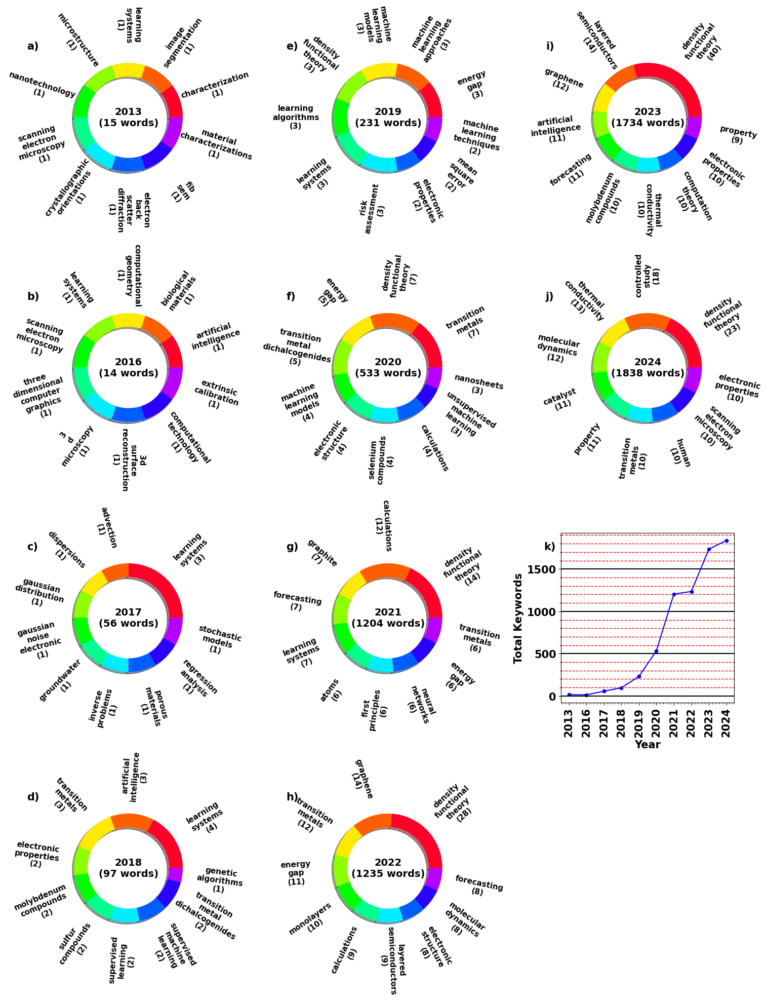

In [22]:
dataframe_year = dataframe['Year']
unique_years_list = dataframe_year.unique().tolist()
print(unique_years_list)
unique_years_list = [year for year in unique_years_list if str(year).isnumeric() == True]
unique_years_list = sorted(unique_years_list)

number_of_years = len(unique_years_list)

max_col = int(np.ceil(np.sqrt(number_of_years+1))) # addtional 1 for the trend progress plot
max_row = max_col
current_col = 0
current_row = -1

plot_cmap = matplotlib.colormaps['gist_rainbow']
plot_cmap_list = [plot_cmap(percentage*0.1) for percentage in range(10)]

fig = plt.figure(figsize=(20,20))

# total words to plot line plot
years_and_values_dict = {}

# label count
axis_label_count = -1

for unique_years in unique_years_list:

    print(unique_years)

    unique_year_dataframe = dataframe[dataframe['Year'] == unique_years].reset_index(drop=True)

    all_unique_year_text_list = []

    for article_index in unique_year_dataframe.index:

        try:

            # preprocess
            article_text = unique_year_dataframe.loc[article_index]['Index Keywords']
            article_text = article_text.split(';')
            article_text = [word.lower() for word in article_text]

            # get rid of special characters ONLY
            unique_year_article_text = [re.sub(r'\W+',' ',word) for word in article_text]
            unique_year_article_text = [word for word in unique_year_article_text if word != '']
            # get rid of random back space
            unique_year_article_text = [word[:-1] if word[-1] == ' ' else word for word in unique_year_article_text]
            # get rid of random front space
            unique_year_article_text = [word[1:] if word[0] == ' ' else word for word in unique_year_article_text]
            # get rid of unwanted words
            unique_year_article_text = [word for word in unique_year_article_text if word not in imported_stopwords]
            # get rid of plurals
            unique_year_article_text = [word[:-1] if word+'s' in unique_year_article_text else word for word in unique_year_article_text]

            all_unique_year_text_list = all_unique_year_text_list + unique_year_article_text

        except:
        
            pass

    # if there are words in the year
    if all_unique_year_text_list != []:

        # counter for strings
        counter_whole_word = collections.Counter(all_unique_year_text_list)

        # get the most common string and its count
        most_common_string = counter_whole_word.most_common(10)

        # counter for axes
        current_row = current_row + 1
        if current_row == max_row:
            current_row = 0
            current_col = current_col + 1

        # plot
        ax = plt.subplot2grid((max_row,max_col),(current_row,current_col))

        # word counter
        labels_list = []
        size_list = []
        for word,count in most_common_string:
            labels_list.append(word+'\n'+f'({count:.0f})')
            size_list.append(count)
        
        # get total words
        total_words = counter_whole_word.total()

        # get rid of space and replace with new line
        labels_list = ['\n'.join(word.split(' ')) for word in labels_list]

        # plot
        wedges,texts = ax.pie(size_list,labels=labels_list,labeldistance=1.7,shadow=True,rotatelabels=True,colors=plot_cmap_list,radius=0.8,wedgeprops=dict(width=0.2),textprops=dict(verticalalignment='center',horizontalalignment='center',size=11))

        # # change color of text
        # for text,color in zip(texts,plot_cmap_list):
        #     text.set_color(color)

        # annotate total words in plot
        ax.text(0.5,0.5,f'{unique_years}\n({total_words} words)',transform=ax.transAxes,verticalalignment='center',horizontalalignment='center',weight='bold',size=14)

        # accumulate years and keywords
        years_and_values_dict[unique_years] = total_words

        # labels
        axis_label_count += 1
        axis_label_string = 'abcdefghijklmnopqrstuvwxyz'
        ax.text(x=-0.1,y=0.9,s=f'{axis_label_string[axis_label_count]})',transform=ax.transAxes,size=font_size_plot)

# plot a summary plot, counter for axes
current_row = current_row + 1
if current_row == max_row:
    current_row = 0
    current_col = current_col + 1

# plot
ax = plt.subplot2grid((max_row,max_col),(current_row,current_col))  
x_values = [str(year) for year in list(years_and_values_dict.keys())] # turn to string to plot categorically
y_values = list(years_and_values_dict.values())
sns.lineplot(x=x_values,y=y_values,ax=ax,color='blue')
sns.scatterplot(x=x_values,y=y_values,ax=ax,color='blue')
ax.set_xlabel('Year')
ax.set_ylabel('Total Keywords')
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
ax.minorticks_on()
ax.grid(which='major',color='black',linestyle='-',linewidth=1.5,axis='y')
ax.grid(which='minor',color='red',linestyle='--',linewidth=1,axis='y')

# labels
axis_label_count += 1
axis_label_string = 'abcdefghijklmnopqrstuvwxyz'
ax.text(x=-0.1,y=0.9,s=f'{axis_label_string[axis_label_count]})',transform=ax.transAxes,size=font_size_plot)

fig.tight_layout()

limit to certain years

[2024, 2023, 2022, 2021, 2020, 2018, 2016, 2017, 2019, 2013, 2014]
[2013, 2014, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]
2019
2020
2021
2022
2023
2024


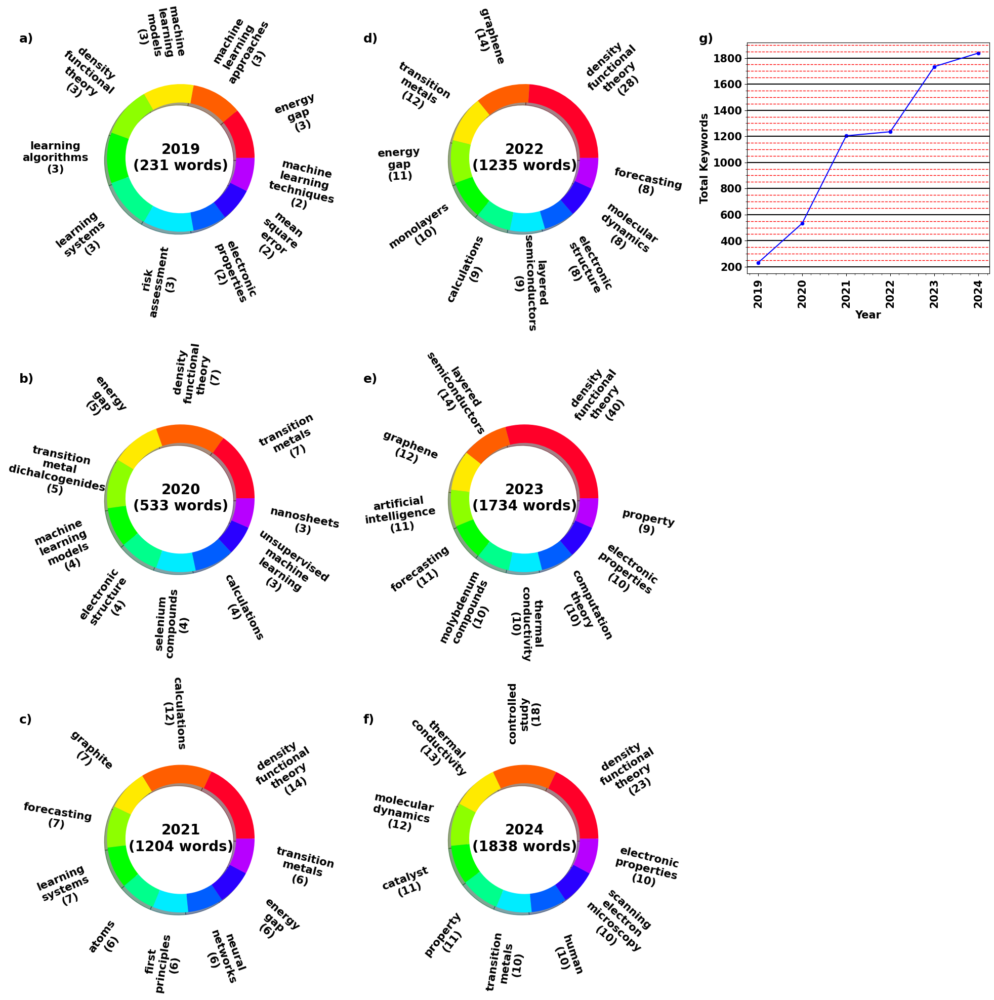

In [23]:
dataframe_year = dataframe['Year']
unique_years_list = dataframe_year.unique().tolist()
print(unique_years_list)
unique_years_list = [year for year in unique_years_list if str(year).isnumeric() == True]
unique_years_list = sorted(unique_years_list)
print(unique_years_list)

# manually determine years
unique_years_list = [2019, 2020, 2021, 2022, 2023, 2024]

number_of_years = len(unique_years_list)

max_col = int(np.ceil(np.sqrt(number_of_years+1))) # addtional 1 for the trend progress plot
max_row = max_col
current_col = 0
current_row = -1

plot_cmap = matplotlib.colormaps['gist_rainbow']
plot_cmap_list = [plot_cmap(percentage*0.1) for percentage in range(10)]

fig = plt.figure(figsize=(20,20))

# total words to plot line plot
years_and_values_dict = {}

# label count
axis_label_count = -1

for unique_years in unique_years_list:

    print(unique_years)

    unique_year_dataframe = dataframe[dataframe['Year'] == unique_years].reset_index(drop=True)

    all_unique_year_text_list = []

    for article_index in unique_year_dataframe.index:

        try:

            # preprocess
            article_text = unique_year_dataframe.loc[article_index]['Index Keywords']
            article_text = article_text.split(';')
            article_text = [word.lower() for word in article_text]

            # get rid of special characters ONLY
            unique_year_article_text = [re.sub(r'\W+',' ',word) for word in article_text]
            unique_year_article_text = [word for word in unique_year_article_text if word != '']
            # get rid of random back space
            unique_year_article_text = [word[:-1] if word[-1] == ' ' else word for word in unique_year_article_text]
            # get rid of random front space
            unique_year_article_text = [word[1:] if word[0] == ' ' else word for word in unique_year_article_text]
            # get rid of unwanted words
            unique_year_article_text = [word for word in unique_year_article_text if word not in imported_stopwords]
            # get rid of plurals
            unique_year_article_text = [word[:-1] if word+'s' in unique_year_article_text else word for word in unique_year_article_text]

            all_unique_year_text_list = all_unique_year_text_list + unique_year_article_text

        except:
        
            pass

    # if there are words in the year
    if all_unique_year_text_list != []:

        # counter for strings
        counter_whole_word = collections.Counter(all_unique_year_text_list)

        # get the most common string and its count
        most_common_string = counter_whole_word.most_common(10)

        # counter for axes
        current_row = current_row + 1
        if current_row == max_row:
            current_row = 0
            current_col = current_col + 1

        # plot
        ax = plt.subplot2grid((max_row,max_col),(current_row,current_col))

        # word counter
        labels_list = []
        size_list = []
        for word,count in most_common_string:
            labels_list.append(word+'\n'+f'({count:.0f})')
            size_list.append(count)

        # get total words
        total_words = counter_whole_word.total()

        # get rid of space and replace with new line
        labels_list = ['\n'.join(word.split(' ')) for word in labels_list]

        # plot
        wedges,texts = ax.pie(size_list,labels=labels_list,labeldistance=1.7,shadow=True,rotatelabels=True,colors=plot_cmap_list,radius=0.8,wedgeprops=dict(width=0.2),textprops=dict(verticalalignment='center',horizontalalignment='center',size=15.5))

        # # change color of text
        # for text,color in zip(texts,plot_cmap_list):
        #     text.set_color(color)

        # annotate total words in plot
        ax.text(0.5,0.5,f'{unique_years}\n({total_words} words)',transform=ax.transAxes,verticalalignment='center',horizontalalignment='center',weight='bold',size=20)

        # accumulate years and keywords
        years_and_values_dict[unique_years] = total_words

        # labels
        axis_label_count += 1
        axis_label_string = 'abcdefghijklmnopqrstuvwxyz'
        ax.text(x=-0.2,y=1,s=f'{axis_label_string[axis_label_count]})',transform=ax.transAxes,size=font_size_plot+3)

# plot a summary plot, counter for axes
current_row = current_row + 1
if current_row == max_row:
    current_row = 0
    current_col = current_col + 1

# plot
ax = plt.subplot2grid((max_row,max_col),(current_row,current_col))  
x_values = [str(year) for year in list(years_and_values_dict.keys())] # turn to string to plot categorically
y_values = list(years_and_values_dict.values())
sns.lineplot(x=x_values,y=y_values,ax=ax,color='blue')
sns.scatterplot(x=x_values,y=y_values,ax=ax,color='blue')
ax.set_xlabel('Year')
ax.set_ylabel('Total Keywords')
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(labels=ax.get_xticklabels(),rotation=90)
ax.minorticks_on()
ax.grid(which='major',color='black',linestyle='-',linewidth=1.5,axis='y')
ax.grid(which='minor',color='red',linestyle='--',linewidth=1,axis='y')

# labels
axis_label_count += 1
axis_label_string = 'abcdefghijklmnopqrstuvwxyz'
ax.text(x=-0.2,y=1,s=f'{axis_label_string[axis_label_count]})',transform=ax.transAxes,size=font_size_plot+3)

fig.tight_layout()

# country year analysis

total counter

In [24]:
dataframe_country = dataframe['Correspondence Address']

imported_country = pd.read_csv('countries.csv')
country_name_list = imported_country['English Name'].to_list()
country_name_list = [word.lower() for word in country_name_list]
country_name_list = country_name_list + ['korea','israel']

accumulated_country_list = []

for country_index in range(len(dataframe_country.index)):

    address = dataframe_country.loc[country_index]

    try:

        full_address_list = []

        address = re.sub(r'[^A-Za-z]+',' ',address)
        address = address.split(' ')
        address = [word.lower() for word in address]

        # for debugging
        full_address = address.copy()

        # misc countries 
        if ('united' and 'states' in address) or ('america' in address):
            full_address_list.append('america')        
        elif ('arab' in address) or ('emirates' in address):
            full_address_list.append('arab emirates')
        elif ('saudi' in address) or ('arabia' in address):
            full_address_list.append('saudi arabia')
        elif ('viet' in address):
            full_address_list.append('vietnam')
        elif ('united' and 'kingdom' in address):
            full_address_list.append('united kingdom')
        elif ('russian' in address):
            full_address_list.append('russia')
        else:
            address = [word for word in address if word in country_name_list]
            address = list(set(address))
            full_address_list = full_address_list + address

        accumulated_country_list = accumulated_country_list + full_address_list

    except:
        pass

# counter for strings
counter_country = collections.Counter(accumulated_country_list)
# print(counter_country)

heatmap

In [25]:
dataframe_country_year = dataframe[['Correspondence Address','Year']]

imported_country = pd.read_csv('countries.csv')
country_name_list = imported_country['English Name'].to_list()
country_name_list = [word.lower() for word in country_name_list]
country_name_list = country_name_list + ['korea','israel']

accumulated_country_list = []

for country_index in range(len(dataframe_country_year.index)):

    address_and_year = dataframe_country_year.loc[country_index]

    if address_and_year.isnull().values.any() != True:

        address = address_and_year['Correspondence Address']
        year = address_and_year['Year']

        full_address_list = []

        # for debugging
        before_address = copy.deepcopy(address)

        address = re.sub(r'[^A-Za-z ]','',address)
        address = address.split(' ')
        address = [word.lower() for word in address if word != '']

        # for debugging
        full_address = copy.deepcopy(address)

        # misc countries 
        if ('united' and 'states' in address) or ('america' in address) or ('usa' in address) or ('us' in address):
            full_address_list.append(['america',year])        
        elif ('arab' in address) or ('emirates' in address):
            full_address_list.append(['arab emirates',year])
        elif ('saudi' in address) or ('arabia' in address):
            full_address_list.append(['saudi arabia',year])
        elif ('viet' in address):
            full_address_list.append(['vietnam',year])
        elif ('united' and 'kingdom' in address) or ('england' in address) or ('scotland' in address):
            full_address_list.append(['united kingdom',year])
        elif ('russian' in address) or ('russia' in address):
            full_address_list.append(['russia',year])
        elif ('turkiye' in address):
            full_address_list.append(['turkey',year])
        elif ('sri' and 'lanka' in address):
            full_address_list.append(['sri lanka',year])
        elif ('africa' in address):
            full_address_list.append(['africa',year])
        elif ('czech' and 'republic' in address):
            full_address_list.append(['czechia',year])
        else: 
            address = [word for word in address if word in country_name_list]
            try:
                address = list(set(address))[0]
            except:
                # handle no country in address
                # print(full_address)
                address = 'Error (NaN)'
            address_and_year = [address,year]

            full_address_list.append(address_and_year)

        accumulated_country_list = accumulated_country_list + full_address_list 
    
    # handle NaN address
    else:

        # print(address_and_year)
        address_and_year = ['Error (NaN)',year]
        full_address_list.append(address_and_year)
        accumulated_country_list = accumulated_country_list + full_address_list 

accumulated_country_list = [[word[0].capitalize(),word[1]] for word in accumulated_country_list]

dataframe_accumulated_country_and_year = pd.DataFrame(accumulated_country_list,columns=['COUNTRY','YEAR'])

country_and_year_and_count_list = []

for country in dataframe_accumulated_country_and_year['COUNTRY'].unique():
    for year in dataframe_accumulated_country_and_year['YEAR'].unique():

        interested_subdataframe = dataframe_accumulated_country_and_year[(dataframe_accumulated_country_and_year['COUNTRY'] == country) & (dataframe_accumulated_country_and_year['YEAR'] == year)]

        country = country
        year = year
        count = len(interested_subdataframe.index)

        country_and_year_and_count_list.append([country,year,count])

dataframe_accumulated_country_and_year_and_count = pd.DataFrame(country_and_year_and_count_list,columns=['COUNTRY','YEAR','COUNT'])

# get total of each year
total_year_list = []
for year in sorted(dataframe_accumulated_country_and_year_and_count['YEAR'].unique().tolist()):
    sum_of_year = dataframe_accumulated_country_and_year_and_count[dataframe_accumulated_country_and_year_and_count['YEAR'] == year]['COUNT'].sum()
    total_year_list.append(sum_of_year)

# the heat map table
pivot_table = pd.pivot_table(data=dataframe_accumulated_country_and_year_and_count,values=['COUNT'],index=['YEAR'],columns=['COUNTRY'])

# append totals
pivot_table[('COUNT','Total')] = total_year_list

# get total of each country
total_country_list = []
for country in pivot_table.columns:
    sum_of_country = pivot_table[country].sum()
    total_country_list.append(sum_of_country)
pivot_table.loc['Total'] = total_country_list

# print(pivot_table.to_string())

plot heatmap

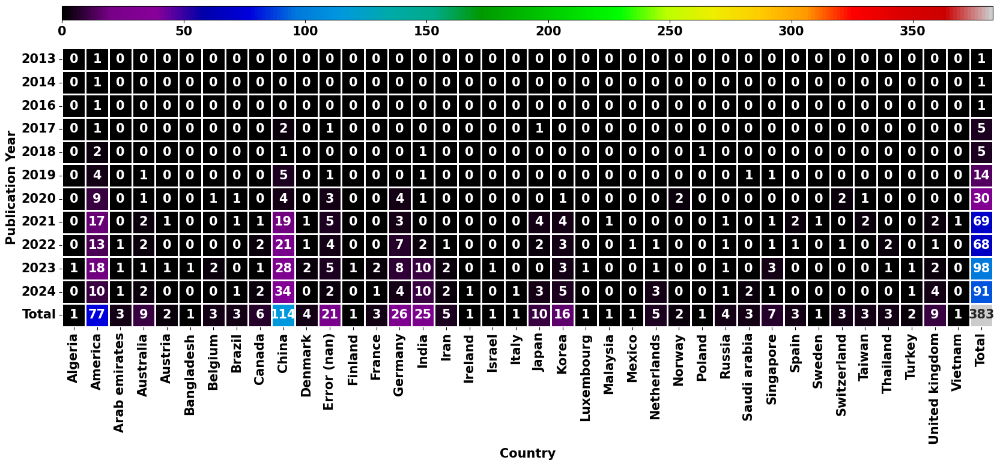

In [26]:
fig = plt.figure(figsize=(20,15))
ax_heatmap = plt.subplot2grid((1,1),(0,0),fig=fig)

values = pivot_table.values
columns = pivot_table.columns.get_level_values(1)
index = pivot_table.index

# heatmap
sns.heatmap(data=values,cmap='nipy_spectral',annot=True,square=True,linewidths=1,cbar_kws=dict(fraction=0.015,pad=0.02),xticklabels=columns,yticklabels=index,ax=ax_heatmap,fmt='.0f',cbar=False)
ax_heatmap.set_xlabel('Country')
ax_heatmap.set_ylabel('Publication Year')

# color bar
axins = inset_axes(ax_heatmap,width='100%',height='5%',loc='upper center',bbox_transform=ax_heatmap.transAxes,borderpad=0,bbox_to_anchor=(0,0.15,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(pivot_table.min().min(),pivot_table.max().max())),cmap='nipy_spectral'),cax=axins,orientation='horizontal')
cbar.ax.tick_params(labelsize=15)

# parameter
ax_heatmap.set_yticks(np.arange(0.5,len(index)))
ax_heatmap.set_yticklabels(index,rotation=0)

plt.show()

# journal impact

some journals are missing or cannot be found in scopus

get sources to search on scopus

In [27]:
journal_name_super_string = ''
journals_list = dataframe['Source title'].unique().tolist()

for count,word in enumerate(journals_list):
    # print(count,word)
    if journal_name_super_string == '':
        journal_name_super_string = word
    else:
        journal_name_super_string = journal_name_super_string + ',' + word
    if count % 5 == 0:
        # print(journal_name_super_string) 
        journal_name_super_string = ''

In [43]:
dataframe_sources = pd.read_csv('Full Source.csv').drop_duplicates(subset=['Source title'])
# dataframe_sources

In [29]:
journal_and_score_dict = {}
for journal in journals_list:
    try:
        journal_cite_score = dataframe_sources[dataframe_sources['Source title'] == journal]['CiteScore'].tolist()[0]
        journal_and_score_dict[journal] = journal_cite_score
    except:
        pass
# print(journal_and_score_dict)

In [30]:
concat_list = []
for journal_name in dataframe['Source title']:
    try:
        concat_list.append(journal_and_score_dict[journal_name])
    except:
        concat_list.append(0)
# print(concat_list)

In [31]:
dataframe_with_score = pd.concat([dataframe,pd.DataFrame(concat_list,columns=['CITESCORE'])],axis='columns')
# print(dataframe_with_score)

get countries and score

In [32]:
dataframe_country_score = dataframe_with_score[['Correspondence Address','CITESCORE','Source title','Cited by']]

imported_country = pd.read_csv('countries.csv')
country_name_list = imported_country['English Name'].to_list()
country_name_list = [word.lower() for word in country_name_list]
country_name_list = country_name_list + ['korea','israel']

accumulated_country_list = []

for country_index in range(len(dataframe_country_score.index)):

    interested_subdataframe = dataframe_country_score.loc[country_index]

    if interested_subdataframe.isnull().values.any() != True:

        address = interested_subdataframe['Correspondence Address']
        score = interested_subdataframe['CITESCORE']
        journal = interested_subdataframe['Source title']
        citeby = interested_subdataframe['Cited by']

        full_address_list = []

        # for debugging
        before_address = copy.deepcopy(address)

        address = re.sub(r'[^A-Za-z ]','',address)
        address = address.split(' ')
        address = [word.lower() for word in address if word != '']

        # for debugging
        full_address = copy.deepcopy(address)

        # misc countries 
        if ('united' and 'states' in address) or ('america' in address) or ('usa' in address) or ('us' in address):
            full_address_list.append(['america',score,journal,citeby])        
        elif ('arab' in address) or ('emirates' in address):
            full_address_list.append(['arab emirates',score,journal,citeby])
        elif ('saudi' in address) or ('arabia' in address):
            full_address_list.append(['saudi arabia',score,journal,citeby])
        elif ('viet' in address):
            full_address_list.append(['vietnam',score,journal,citeby])
        elif ('united' and 'kingdom' in address) or ('england' in address) or ('scotland' in address):
            full_address_list.append(['united kingdom',score,journal,citeby])
        elif ('russian' in address) or ('russia' in address):
            full_address_list.append(['russia',score,journal,citeby])
        elif ('turkiye' in address):
            full_address_list.append(['turkey',score,journal,citeby])
        elif ('sri' and 'lanka' in address):
            full_address_list.append(['sri lanka',score,journal,citeby])
        elif ('africa' in address):
            full_address_list.append(['africa',score,journal,citeby])
        elif ('czech' and 'republic' in address):
            full_address_list.append(['czechia',score,journal,citeby])
        else: 
            address = [word for word in address if word in country_name_list]
            try:
                address = list(set(address))[0]
            except:
                # handle no country in address
                address = 'Error (NaN)'

            full_address_list.append([address,score,journal,citeby])

        accumulated_country_list = accumulated_country_list + full_address_list 
    
    # handle NaN address
    else:

        full_address_list.append(['Error (NaN)',score,journal,citeby])
        accumulated_country_list = accumulated_country_list + full_address_list 

accumulated_country_list = [[word[0].capitalize(),word[1],word[2],word[3]] for word in accumulated_country_list]

dataframe_accumulated_country_and_score = pd.DataFrame(accumulated_country_list,columns=['COUNTRY','SCORE','JOURNAL','CITEDBY'])

# print(dataframe_accumulated_country_and_score.to_string())

dataframe_journal_impact = pd.DataFrame()

for country in dataframe_accumulated_country_and_score['COUNTRY'].unique():
    mean_score = dataframe_accumulated_country_and_score[dataframe_accumulated_country_and_score['COUNTRY'] == country]['SCORE'].mean()
    number_of_journals = len(dataframe_accumulated_country_and_score[dataframe_accumulated_country_and_score['COUNTRY'] == country]['SCORE'])
    mean_citedby = dataframe_accumulated_country_and_score[dataframe_accumulated_country_and_score['COUNTRY'] == country]['CITEDBY'].sum()
    mean_score = pd.DataFrame([[mean_score,number_of_journals,mean_citedby]],columns=['MEAN SCORE','NUMBER OF JOURNALS','CITEDBY'])
    top_journal = dataframe_accumulated_country_and_score[dataframe_accumulated_country_and_score['COUNTRY'] == country][['SCORE','JOURNAL','COUNTRY']]
    top_journal = top_journal[top_journal['SCORE'] == top_journal['SCORE'].max()].reset_index(drop=True).iloc[[0]].rename(dict(SCORE='TOP SCORE',JOURNAL='TOP JOURNAL'),axis='columns')

    temp_df = pd.concat([mean_score,top_journal],axis='columns')
    temp_df['COUNTRY'] = country

    dataframe_journal_impact = pd.concat([dataframe_journal_impact,temp_df],axis='rows')

# print(dataframe_journal_impact)

In [33]:
dataframe_adjusted = pd.DataFrame([dataframe_journal_impact['MEAN SCORE'].to_list(),dataframe_journal_impact['TOP SCORE'].to_list()],columns=[dataframe_journal_impact['COUNTRY'].to_list()])
dataframe_adjusted = dataframe_adjusted.rename({0:'MEAN SCORE',1:'TOP SCORE'},axis='rows')
# print(dataframe_adjusted.to_string())

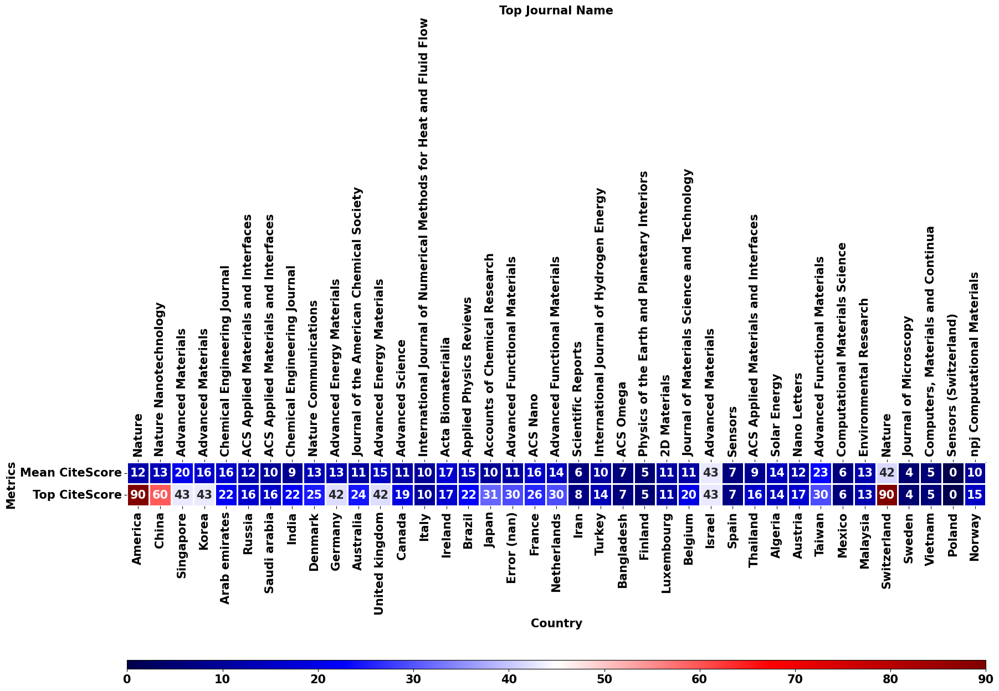

In [34]:
fig = plt.figure(figsize=(20,15))
ax_heatmap = plt.subplot2grid((1,1),(0,0),fig=fig)
ax_heatmap.ticklabel_format(useOffset=False)
ax_heatmap_twin = ax_heatmap.secondary_xaxis('top')

# heatmap
sns.heatmap(data=dataframe_adjusted,cmap='seismic',annot=True,square=True,linewidths=1,cbar_kws=dict(fraction=0.01,pad=0.02),xticklabels=dataframe_adjusted.columns.get_level_values(0),yticklabels=dataframe_adjusted.index,ax=ax_heatmap,fmt='.0f',cbar=False)
ax_heatmap.set_xlabel('Country')
ax_heatmap.set_ylabel('Metrics')
ax_heatmap.set_yticklabels(['Mean CiteScore','Top CiteScore'])

# set second x axis labels
ax_heatmap_twin.set_xticks(np.arange(0.5,len(dataframe_journal_impact['TOP JOURNAL'])))
ax_heatmap_twin.set_xticklabels(dataframe_journal_impact['TOP JOURNAL'],rotation=90)
ax_heatmap_twin.set_xlabel('Top Journal Name')

# color bar
axins = inset_axes(ax_heatmap,width='100%',height='20%',loc='upper center',bbox_transform=ax_heatmap.transAxes,borderpad=0,bbox_to_anchor=(0,-4.5,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(dataframe_adjusted.min().min(),dataframe_adjusted.max().max())),cmap='seismic'),cax=axins,orientation='horizontal')
cbar.ax.tick_params(labelsize=15)

plt.show()

cited by

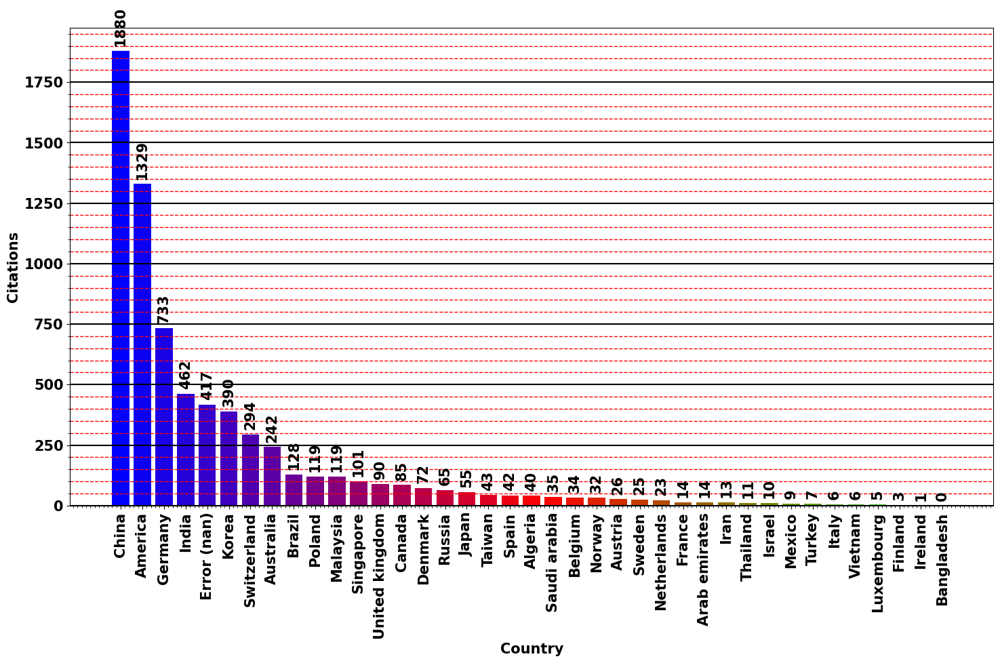

In [35]:
fig = plt.figure(figsize=(15,10))
ax_citedby = plt.subplot2grid((1,1),(0,0),fig=fig)

interested_subdataframe = dataframe_journal_impact[['COUNTRY','CITEDBY']]
interested_subdataframe = interested_subdataframe.sort_values(by=['CITEDBY'],ascending=False)

color_map = plt.get_cmap('brg')
color_list = [tuple([x for x_count,x in enumerate(color_map(1*(value/len(interested_subdataframe['COUNTRY'].to_list())))) if x_count != 3]) for value in range(len(interested_subdataframe['COUNTRY'].to_list()))]

ax_citedby.bar(x=interested_subdataframe['COUNTRY'].to_list(),height=interested_subdataframe['CITEDBY'].to_list(),color=color_list)
ax_citedby.tick_params(axis='x',labelrotation=90)

for container in ax_citedby.containers:
    ax_citedby.bar_label(container,fontsize=15,rotation=90,padding=5)

ax_citedby.minorticks_on()
ax_citedby.grid(which='major',color='black',linestyle='-',linewidth=1.5,axis='y')
ax_citedby.grid(which='minor',color='red',linestyle='--',linewidth=1,axis='y')

ax_citedby.set_xlabel('Country')
ax_citedby.set_ylabel('Citations')

fig.tight_layout()

top cited paper 

In [36]:
# print(dataframe_with_score)

In [37]:
data_frame_top_cited_paper = dataframe_with_score[['Source title','CITESCORE','Correspondence Address']] 
# print(data_frame_top_cited_paper)

# Title + DOI

In [38]:
dataframe_top_cited_paper = dataframe_with_score[['Title','Source title','CITESCORE','Correspondence Address','Cited by','DOI']] 

imported_country = pd.read_csv('countries.csv')
country_name_list = imported_country['English Name'].to_list()
country_name_list = [word.lower() for word in country_name_list]
country_name_list = country_name_list + ['korea','israel']

accumulated_country_list = []


for country_index in range(len(dataframe_top_cited_paper.index)):

    interested_subdataframe = dataframe_top_cited_paper.loc[country_index]

    if interested_subdataframe.isnull().values.any() != True:
    
        address = interested_subdataframe['Correspondence Address']
        source = interested_subdataframe['Source title']
        score = interested_subdataframe['CITESCORE']
        title = interested_subdataframe['Title']
        citeby = interested_subdataframe['Cited by']
        DOI_string = interested_subdataframe['DOI']

        full_address_list = []

        # for debugging
        before_address = copy.deepcopy(address)

        address = re.sub(r'[^A-Za-z ]','',address)
        address = address.split(' ')
        address = [word.lower() for word in address if word != '']

        # for debugging
        full_address = copy.deepcopy(address)

        # misc countries 
        if ('united' and 'states' in address) or ('america' in address) or ('usa' in address) or ('us' in address):
            full_address_list.append(['america',source,score,title,citeby,DOI_string])        
        elif ('arab' in address) or ('emirates' in address):
            full_address_list.append(['arab emirates',source,score,title,citeby,DOI_string])
        elif ('saudi' in address) or ('arabia' in address):
            full_address_list.append(['saudi arabia',source,score,title,citeby,DOI_string])
        elif ('viet' in address):
            full_address_list.append(['vietnam',source,score,title,citeby,DOI_string])
        elif ('united' and 'kingdom' in address) or ('england' in address) or ('scotland' in address):
            full_address_list.append(['united kingdom',source,score,title,citeby,DOI_string])
        elif ('russian' in address) or ('russia' in address):
            full_address_list.append(['russia',source,score,title,citeby,DOI_string])
        elif ('turkiye' in address):
            full_address_list.append(['turkey',source,score,title,citeby,DOI_string])
        elif ('sri' and 'lanka' in address):
            full_address_list.append(['sri lanka',source,score,title,citeby,DOI_string])
        elif ('africa' in address):
            full_address_list.append(['africa',source,score,title,citeby,DOI_string])
        elif ('czech' and 'republic' in address):
            full_address_list.append(['czechia',source,score,title,citeby,DOI_string])
        else: 
            address = [word for word in address if word in country_name_list]
            try:
                address = list(set(address))[0]
            except:
                # handle no country in address
                address = 'Error (NaN)'

            full_address_list.append([address,source,score,title,citeby,DOI_string])

        accumulated_country_list = accumulated_country_list + full_address_list 

accumulated_country_list = [[word[0].capitalize(),word[1],word[2],word[3],word[4],word[5]] for word in accumulated_country_list]

dataframe_top_cited_paper_cleaned = pd.DataFrame(accumulated_country_list,columns=['COUNTRY','SOURCE','CITESCORE','TITLE','CITATIONS','DOI'])

# print(dataframe_top_cited_paper_cleaned)

In [39]:
dataframe_rearranged_top_cited_paper = pd.DataFrame()
for country in dataframe_top_cited_paper_cleaned['COUNTRY'].unique():
    # get country
    interested_subdataframe = dataframe_top_cited_paper_cleaned[dataframe_top_cited_paper_cleaned['COUNTRY'] == country].sort_values(by=['CITATIONS'],ascending=False)
    # top cited paper
    top_cited_paper = interested_subdataframe.iloc[0].to_frame().transpose()
    # sum of citation
    citation_summation = interested_subdataframe['CITATIONS'].sum()
    top_cited_paper['SUMCITEDBY'] = citation_summation
    # get total number of papers published
    number_of_publications = len(interested_subdataframe)
    top_cited_paper['NUMBEROFPUBLICATION'] = number_of_publications
    # combine dataframe
    dataframe_rearranged_top_cited_paper = pd.concat([top_cited_paper,dataframe_rearranged_top_cited_paper],axis='rows')
dataframe_rearranged_top_cited_paper = dataframe_rearranged_top_cited_paper.reset_index(drop=True)
# print(dataframe_rearranged_top_cited_paper)

In [40]:
dataframe_adjusted = pd.DataFrame([dataframe_rearranged_top_cited_paper['CITATIONS'].to_list(),dataframe_rearranged_top_cited_paper['SUMCITEDBY'].to_list(),dataframe_rearranged_top_cited_paper['NUMBEROFPUBLICATION']],columns=[dataframe_rearranged_top_cited_paper['COUNTRY'].to_list()])
dataframe_adjusted = dataframe_adjusted.rename({0:'Highest Citation',1:'Sum Citations',2:'Publications'},axis='rows')
dataframe_adjusted = dataframe_adjusted.transpose()
# print(dataframe_adjusted.to_string())

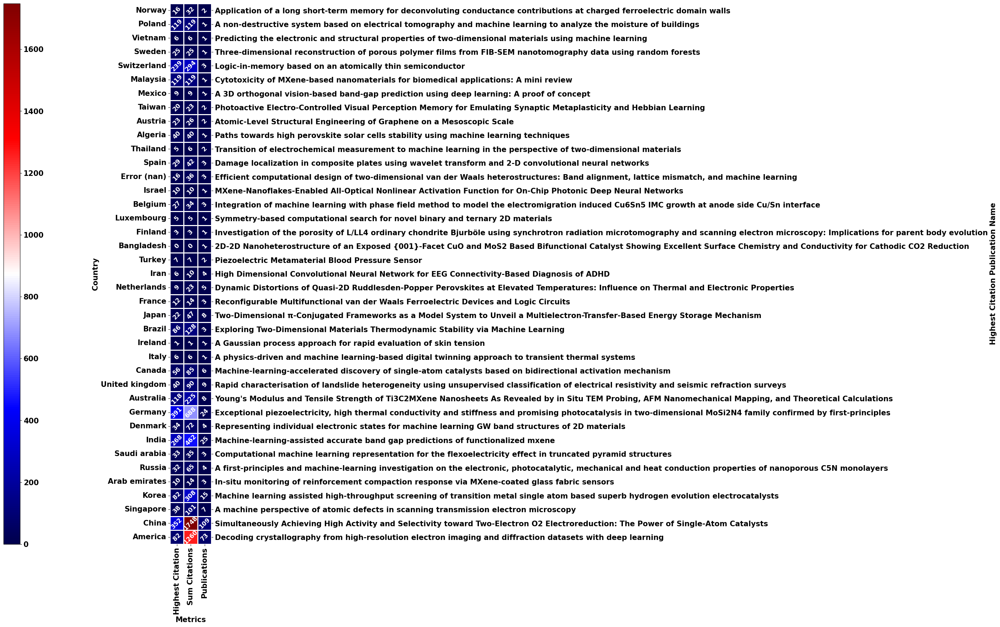

In [41]:
fig = plt.figure(figsize=(20,20))
ax_heatmap = plt.subplot2grid((1,1),(0,0),fig=fig)
ax_heatmap.ticklabel_format(useOffset=False)
ax_heatmap_twin = ax_heatmap.secondary_yaxis('right')

# heatmap
sns.heatmap(data=dataframe_adjusted,cmap='seismic',annot=True,square=True,linewidths=1,fmt='.0f',cbar=False,ax=ax_heatmap,annot_kws=dict(rotation=45,size=12.5))
ax_heatmap.set_xlabel('Metrics')
ax_heatmap.set_ylabel('Country')

# set second y axis labels
ax_heatmap_twin.set_yticks(np.arange(0.5,len(dataframe_rearranged_top_cited_paper['TITLE'])))
ax_heatmap_twin.set_yticklabels(dataframe_rearranged_top_cited_paper['TITLE'])
ax_heatmap_twin.set_ylabel('Highest Citation Publication Name',rotation=90)
ax_heatmap_twin.set_frame_on(False)

# color bar
axins = inset_axes(ax_heatmap,width='40%',height='100%',loc='center left',bbox_transform=ax_heatmap.transAxes,borderpad=0,bbox_to_anchor=(-4,0,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(dataframe_adjusted.min().min(),dataframe_adjusted.max().max())),cmap='seismic'),cax=axins,orientation='vertical')
cbar.ax.tick_params(labelsize=15)

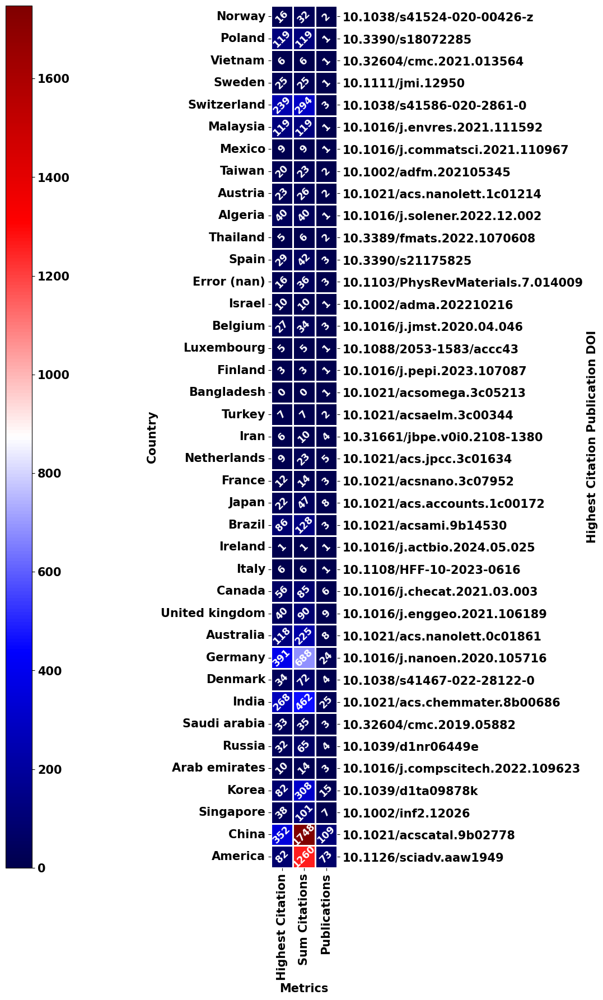

In [42]:
fig = plt.figure(figsize=(20,20))
ax_heatmap = plt.subplot2grid((1,1),(0,0),fig=fig)
ax_heatmap.ticklabel_format(useOffset=False)
ax_heatmap_twin = ax_heatmap.secondary_yaxis('right')

# heatmap
sns.heatmap(data=dataframe_adjusted,cmap='seismic',annot=True,square=True,linewidths=1,fmt='.0f',cbar=False,ax=ax_heatmap,annot_kws=dict(rotation=45,size=12.5))
ax_heatmap.set_xlabel('Metrics')
ax_heatmap.set_ylabel('Country')

# set second y axis labels
ax_heatmap_twin.set_yticks(np.arange(0.5,len(dataframe_rearranged_top_cited_paper['DOI'])))
ax_heatmap_twin.set_yticklabels(dataframe_rearranged_top_cited_paper['DOI'])
ax_heatmap_twin.set_ylabel('Highest Citation Publication DOI',rotation=90)
ax_heatmap_twin.set_frame_on(False)

# color bar
axins = inset_axes(ax_heatmap,width='40%',height='100%',loc='center left',bbox_transform=ax_heatmap.transAxes,borderpad=0,bbox_to_anchor=(-4,0,1,1)) # (x0,y0,width,height)
cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=(matplotlib.colors.Normalize(dataframe_adjusted.min().min(),dataframe_adjusted.max().max())),cmap='seismic'),cax=axins,orientation='vertical')
cbar.ax.tick_params(labelsize=15)